# Adapting Mask-RCNN for document segmentation

Mask-RCNN is a flexible, state of the art model for instance segmentation.

<img src="img/iseg.png" width=400 height=400>

(Source: https://engineering.matterport.com/splash-of-color-instance-segmentation-with-mask-r-cnn-and-tensorflow-7c761e238b46)

It is a very simple, but intuitive, extension of the widely successful Faster-RCNN model. Faster-RCNN combines object detection and semantic segmantation to output a bounding box and class for each identafiable object in an image. Mask-RCNN simply adds another branch for mask prediction, which means producing a mask for each bounding box representing which part of the image actually corresponds to the class.

<img src="img/overview.png" width=800 height=400>

We have retrained and tuned Mask-RCNN for the task of document segmentation. In our task, we wish to segment the important regions of each document and classify them. Given our trained weights, lets run inference on a couple of images and see the results.

In [1]:
from mrcnn.config import Config
from PIL import Image, ImageDraw, ImageFont
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
from mrcnn.model import log
from dataset import PageDataset
import numpy as np
from mrcnn import visualize
from tqdm import tqdm
from config import PageConfig
from random import sample
from argparse import ArgumentParser
from voc_utils import ICDAR_convert
import matplotlib.pyplot as plt

# Set paths
data_path = 'data/'
weights_path = 'weights/'

Using TensorFlow backend.


## Configuration setup

In [2]:
class InferenceConfig(Config):
        NAME = "pages"
        BACKBONE = "resnet50"
        GPU_COUNT = 1
        IMAGE_MAX_DIM = 1920
        RPN_ANCHOR_SCALES = (32,64, 256, 512,1024)
        NUM_CLASSES = 4
        IMAGES_PER_GPU = 1

## Some visualization functions

In [101]:
def rect(d, im, color, points):
        for i, pt in enumerate(points[:-1]):
                d.line((pt, points[i+1]), fill=color, width=4)

def draw_rois(d, im, color, rois, cls, down=False, scores=None):
        #print(len(rois))
        #print(len(cls))
        for idx, roi in enumerate(rois):
                # Filter low score ROIs
                if scores is not None:
                    if scores[idx] < .8:
                        continue
                y1, x1, y2, x2 = roi
                # Slightly feather the results due to handle alignment truncation
                x1, y1, x2, y2 = x1-30, y1-10, x2+30, y2+10
                points = (x1, y1), (x2, y1), (x2, y2), (x1, y2), (x1, y1)
                if not down:
                    text_points = (x1 + 10, y1 + 10)
                if down:
                    text_points = (x1 + 50, y1 + 50)
                #print(cls)
                #print(rois)
                #print('-----')
                ks = ['Figure', 'Equation', 'Table']
                key = ks[cls[idx]-1]
                d.text(text_points, key, fill=color, font=ImageFont.truetype("/usr/share/fonts/truetype/dejavu/DejaVuSans-Bold.ttf", 30, encoding="unic"))
                
                #d.rectangle([x1, y1, x2, y2], outline=color)
                rect(d, im, color, points )

def draw_image(name, path, rois, gt_rois, gt_classes, classes, scores):
        im = Image.open(path)
        d = ImageDraw.Draw(im)
        draw_rois(d, im, "#f00", rois, classes)
        draw_rois(d, im, "#00f", gt_rois, gt_classes, down=True)
        print(name)
        im.save(f"result_icdar/{name}.png", "png")
        plt.figure(figsize=(20, 20))
        plt.imshow(np.asarray(im), aspect='auto')

## Prepare the model and sample an image

In [42]:
inference_config = InferenceConfig()
config = PageConfig()
model = modellib.MaskRCNN(mode="inference",
                          config=inference_config,
                          model_dir=weights_path)

model_path = model.find_last()

print("Loading weights from ", weights_path)
model.load_weights('weights/pages/mask_rcnn_pages_0174.h5', by_name=True)
data_test = PageDataset('test', data_path, 0)
data_test.load_page(classes=['figureRegion', 'formulaRegion', 'tableRegion'])
data_test.prepare()
image_ids = data_test.image_ids

Loading weights from  weights/
loaded 485 images



In [131]:
image_ids1 = sample(list(image_ids), 50)

## Finally lets run the model on the sample

  0%|          | 0/50 [00:00<?, ?it/s]

POD_1655


  2%|▏         | 1/50 [00:01<01:00,  1.24s/it]

POD_0081


  4%|▍         | 2/50 [00:02<00:59,  1.25s/it]

POD_0288


  6%|▌         | 3/50 [00:03<00:58,  1.25s/it]

POD_0875


  8%|▊         | 4/50 [00:05<01:06,  1.44s/it]

POD_1615


 10%|█         | 5/50 [00:07<01:12,  1.61s/it]

POD_0062


 12%|█▏        | 6/50 [00:08<01:06,  1.50s/it]

POD_1844


 14%|█▍        | 7/50 [00:10<01:05,  1.52s/it]

POD_1039


 16%|█▌        | 8/50 [00:11<01:03,  1.51s/it]

POD_0563


 18%|█▊        | 9/50 [00:14<01:11,  1.76s/it]

POD_1369


 20%|██        | 10/50 [00:15<01:04,  1.60s/it]

POD_0462


 22%|██▏       | 11/50 [00:16<00:58,  1.49s/it]

POD_0885


 24%|██▍       | 12/50 [00:18<01:02,  1.63s/it]

POD_1699


 26%|██▌       | 13/50 [00:20<01:02,  1.70s/it]

POD_0494


 28%|██▊       | 14/50 [00:21<00:54,  1.53s/it]

POD_0491


 30%|███       | 15/50 [00:23<00:53,  1.52s/it]

POD_1806


 32%|███▏      | 16/50 [00:24<00:50,  1.47s/it]

POD_1152


 34%|███▍      | 17/50 [00:25<00:47,  1.44s/it]

POD_1362


 36%|███▌      | 18/50 [00:28<00:52,  1.65s/it]

POD_0334


 38%|███▊      | 19/50 [00:29<00:51,  1.65s/it]

POD_0093


 40%|████      | 20/50 [00:31<00:46,  1.55s/it]

POD_1302


/users/ankurgos/MaskMount/anaconda3/envs/rcnn/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
 42%|████▏     | 21/50 [00:32<00:43,  1.50s/it]

POD_1166


/users/ankurgos/MaskMount/anaconda3/envs/rcnn/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
 44%|████▍     | 22/50 [00:34<00:44,  1.58s/it]

POD_2393


/users/ankurgos/MaskMount/anaconda3/envs/rcnn/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
 46%|████▌     | 23/50 [00:35<00:39,  1.46s/it]

POD_1378


/users/ankurgos/MaskMount/anaconda3/envs/rcnn/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
 48%|████▊     | 24/50 [00:36<00:36,  1.39s/it]

POD_2120


/users/ankurgos/MaskMount/anaconda3/envs/rcnn/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
 50%|█████     | 25/50 [00:37<00:33,  1.33s/it]

POD_1923


/users/ankurgos/MaskMount/anaconda3/envs/rcnn/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
 52%|█████▏    | 26/50 [00:38<00:30,  1.25s/it]

POD_2076


/users/ankurgos/MaskMount/anaconda3/envs/rcnn/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
 54%|█████▍    | 27/50 [00:39<00:27,  1.18s/it]

POD_2066


/users/ankurgos/MaskMount/anaconda3/envs/rcnn/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
 56%|█████▌    | 28/50 [00:41<00:25,  1.17s/it]

POD_0729


/users/ankurgos/MaskMount/anaconda3/envs/rcnn/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
 58%|█████▊    | 29/50 [00:42<00:25,  1.24s/it]

POD_1092


/users/ankurgos/MaskMount/anaconda3/envs/rcnn/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
 60%|██████    | 30/50 [00:43<00:23,  1.17s/it]

POD_0343


/users/ankurgos/MaskMount/anaconda3/envs/rcnn/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
 62%|██████▏   | 31/50 [00:44<00:20,  1.10s/it]

POD_0082


/users/ankurgos/MaskMount/anaconda3/envs/rcnn/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
 64%|██████▍   | 32/50 [00:46<00:24,  1.37s/it]

POD_0055


/users/ankurgos/MaskMount/anaconda3/envs/rcnn/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
 66%|██████▌   | 33/50 [00:47<00:23,  1.37s/it]

POD_0622


/users/ankurgos/MaskMount/anaconda3/envs/rcnn/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
 68%|██████▊   | 34/50 [00:49<00:25,  1.60s/it]

POD_1899


/users/ankurgos/MaskMount/anaconda3/envs/rcnn/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
 70%|███████   | 35/50 [00:51<00:22,  1.50s/it]

POD_1315


/users/ankurgos/MaskMount/anaconda3/envs/rcnn/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
 72%|███████▏  | 36/50 [00:52<00:20,  1.47s/it]

POD_1619


/users/ankurgos/MaskMount/anaconda3/envs/rcnn/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
 74%|███████▍  | 37/50 [00:54<00:19,  1.48s/it]

POD_1575


/users/ankurgos/MaskMount/anaconda3/envs/rcnn/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
 76%|███████▌  | 38/50 [00:55<00:17,  1.44s/it]

POD_2309


/users/ankurgos/MaskMount/anaconda3/envs/rcnn/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
 78%|███████▊  | 39/50 [00:56<00:14,  1.35s/it]

POD_0079


/users/ankurgos/MaskMount/anaconda3/envs/rcnn/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
 80%|████████  | 40/50 [00:57<00:12,  1.28s/it]

POD_1000


/users/ankurgos/MaskMount/anaconda3/envs/rcnn/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
 82%|████████▏ | 41/50 [00:58<00:11,  1.29s/it]

POD_1095


/users/ankurgos/MaskMount/anaconda3/envs/rcnn/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
 84%|████████▍ | 42/50 [01:00<00:10,  1.30s/it]

POD_1746


/users/ankurgos/MaskMount/anaconda3/envs/rcnn/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
 86%|████████▌ | 43/50 [01:01<00:08,  1.22s/it]

POD_0116


/users/ankurgos/MaskMount/anaconda3/envs/rcnn/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
 88%|████████▊ | 44/50 [01:02<00:07,  1.29s/it]

POD_0813


/users/ankurgos/MaskMount/anaconda3/envs/rcnn/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
 90%|█████████ | 45/50 [01:03<00:06,  1.24s/it]

POD_2254


/users/ankurgos/MaskMount/anaconda3/envs/rcnn/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
 92%|█████████▏| 46/50 [01:05<00:05,  1.25s/it]

POD_1396


/users/ankurgos/MaskMount/anaconda3/envs/rcnn/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
 94%|█████████▍| 47/50 [01:06<00:03,  1.16s/it]

POD_1182


/users/ankurgos/MaskMount/anaconda3/envs/rcnn/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
 96%|█████████▌| 48/50 [01:07<00:02,  1.18s/it]

POD_2171


/users/ankurgos/MaskMount/anaconda3/envs/rcnn/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
 98%|█████████▊| 49/50 [01:08<00:01,  1.15s/it]

POD_1632


/users/ankurgos/MaskMount/anaconda3/envs/rcnn/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
100%|██████████| 50/50 [01:09<00:00,  1.18s/it]


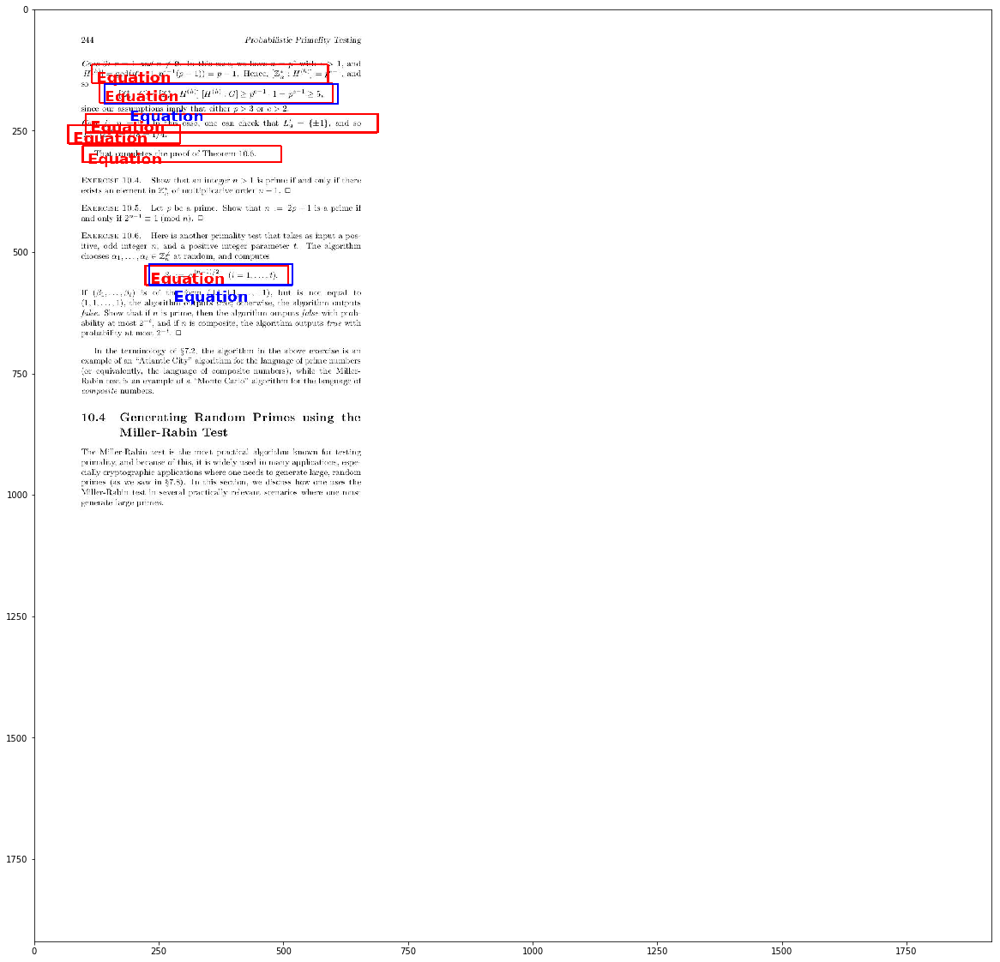

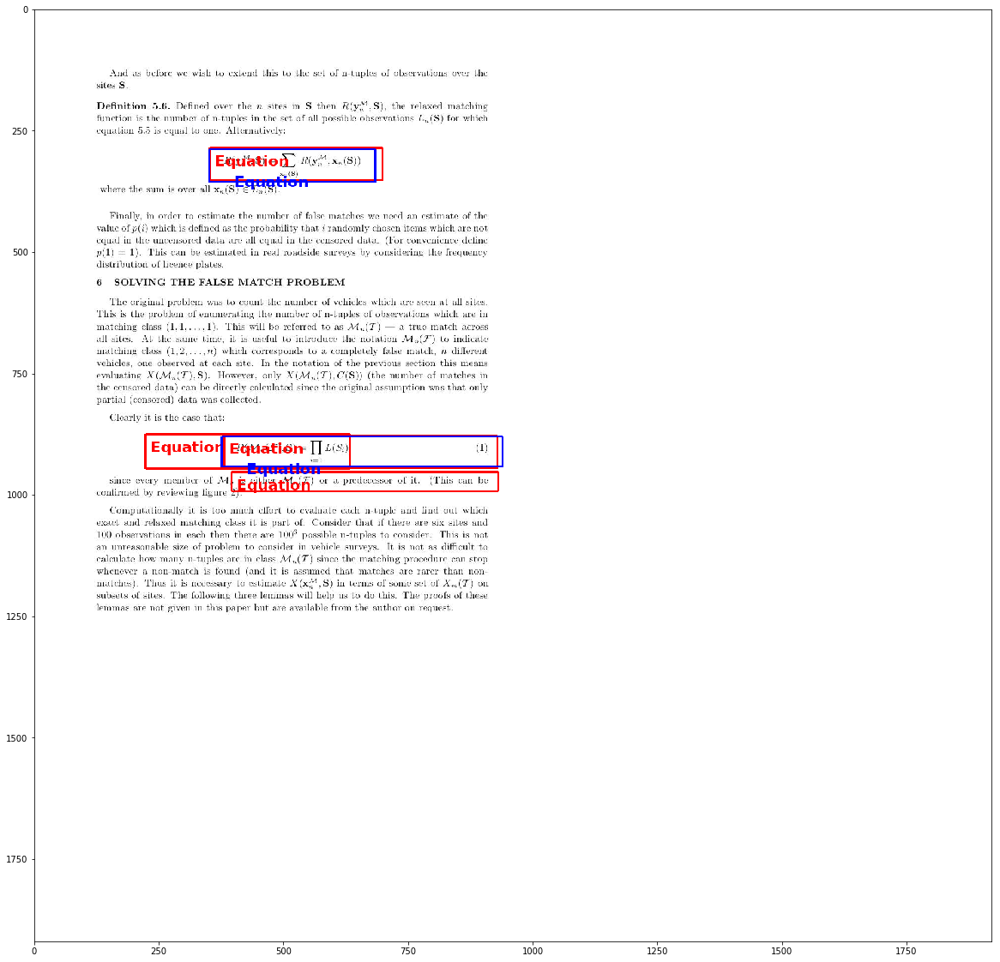

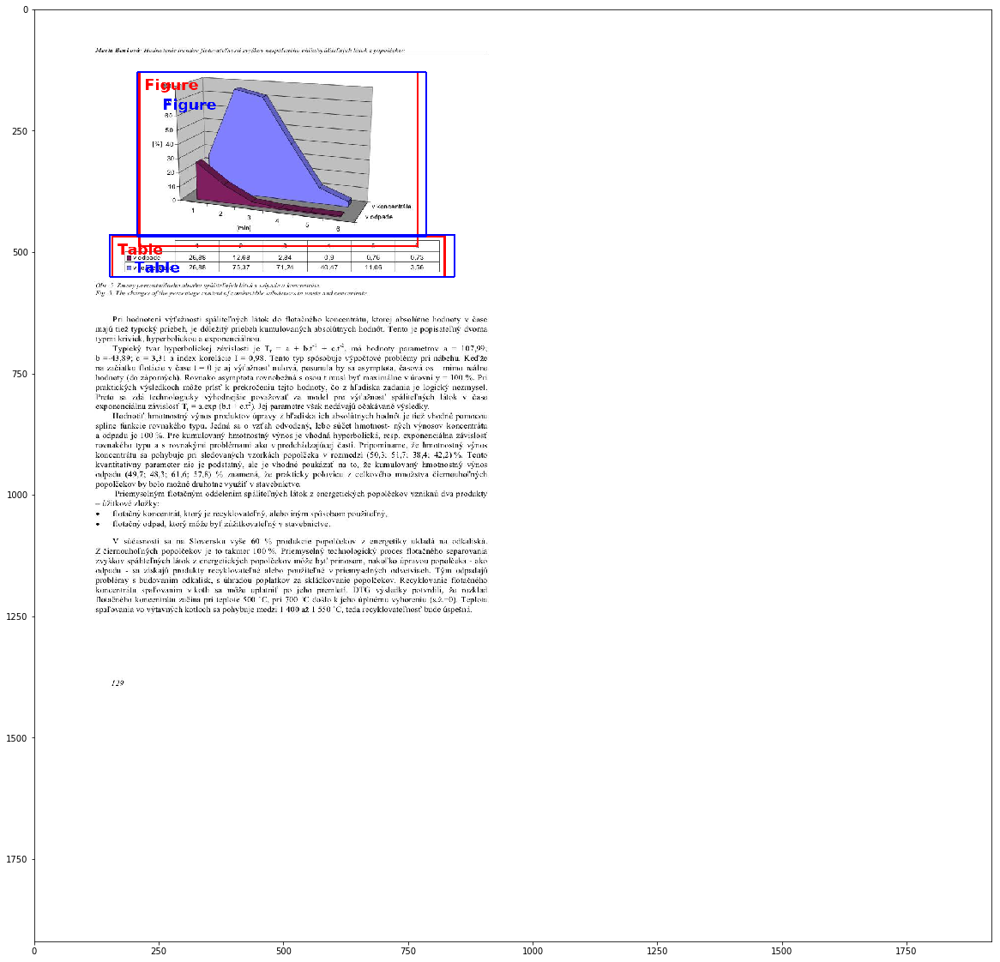

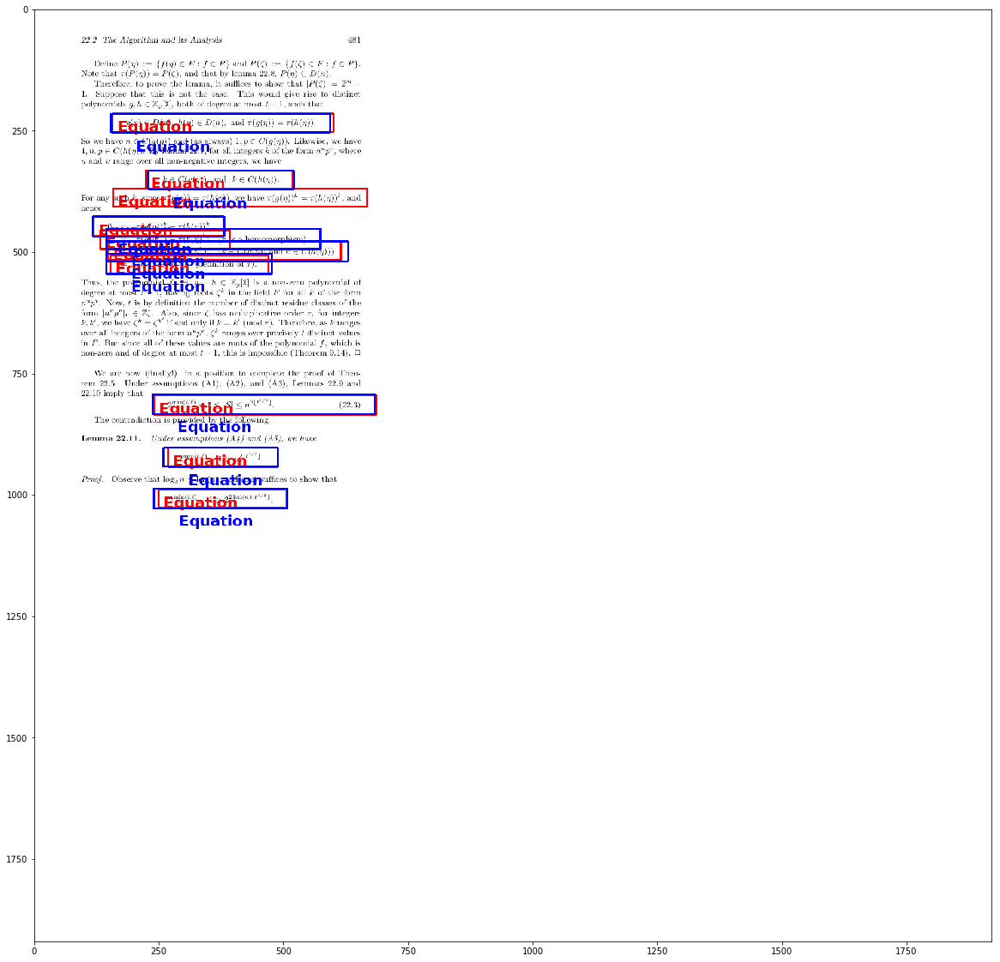

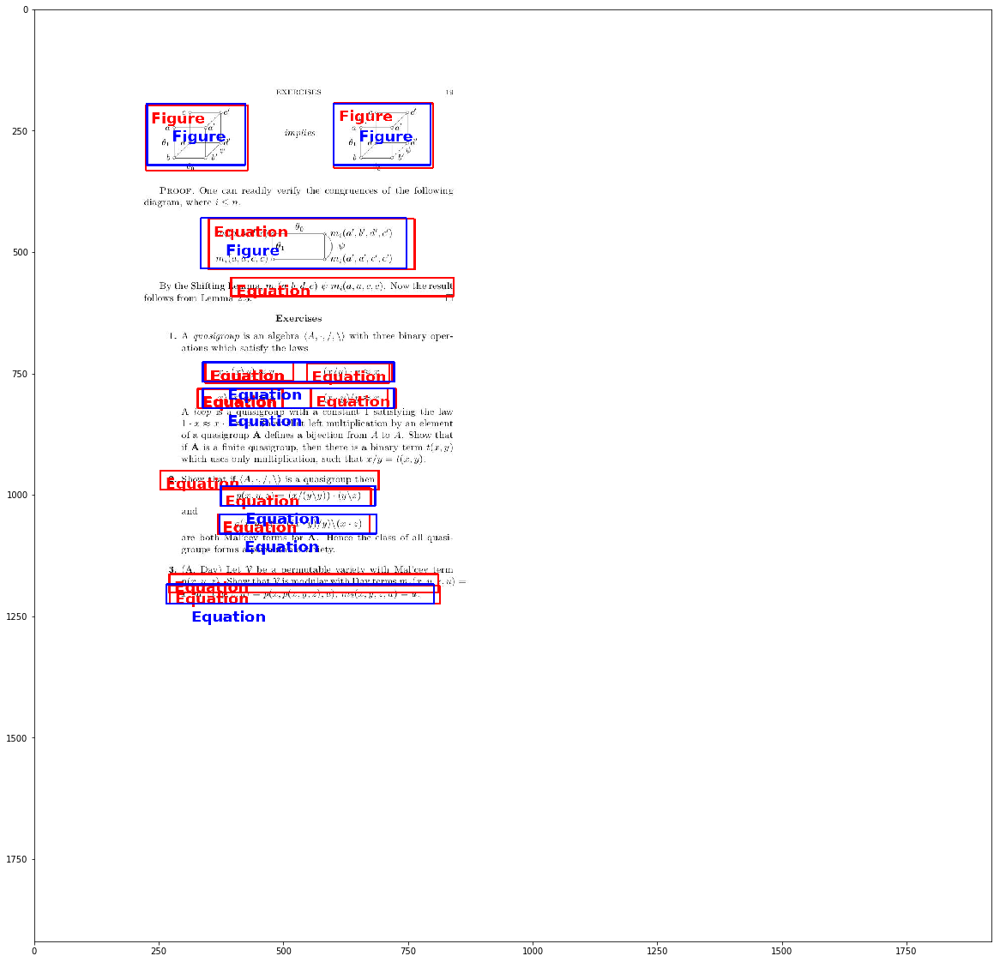

...

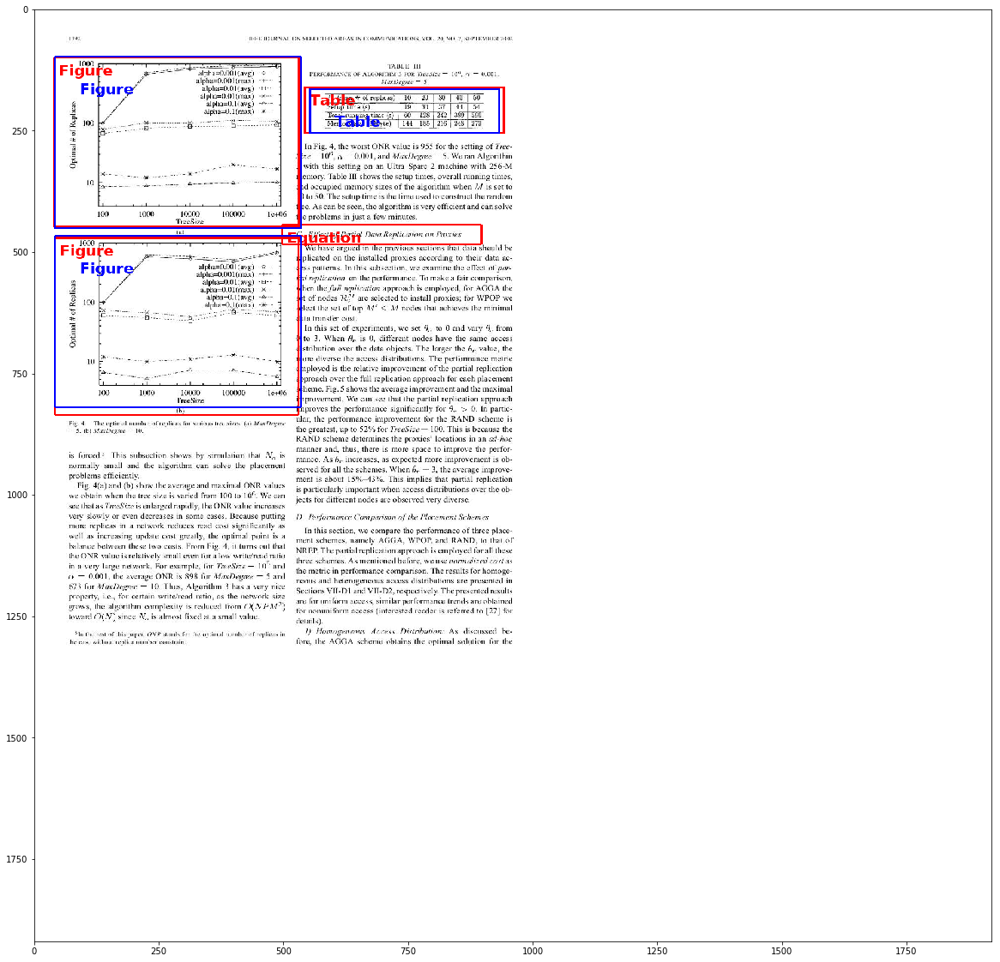

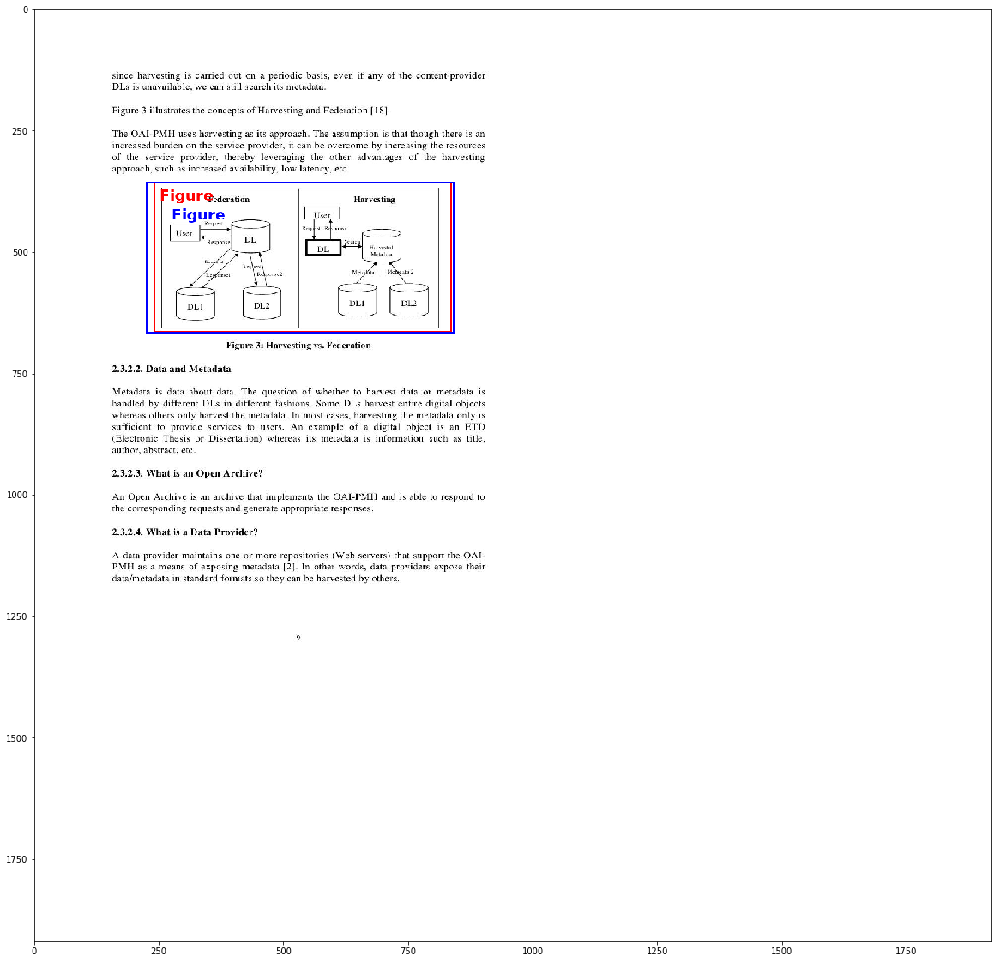

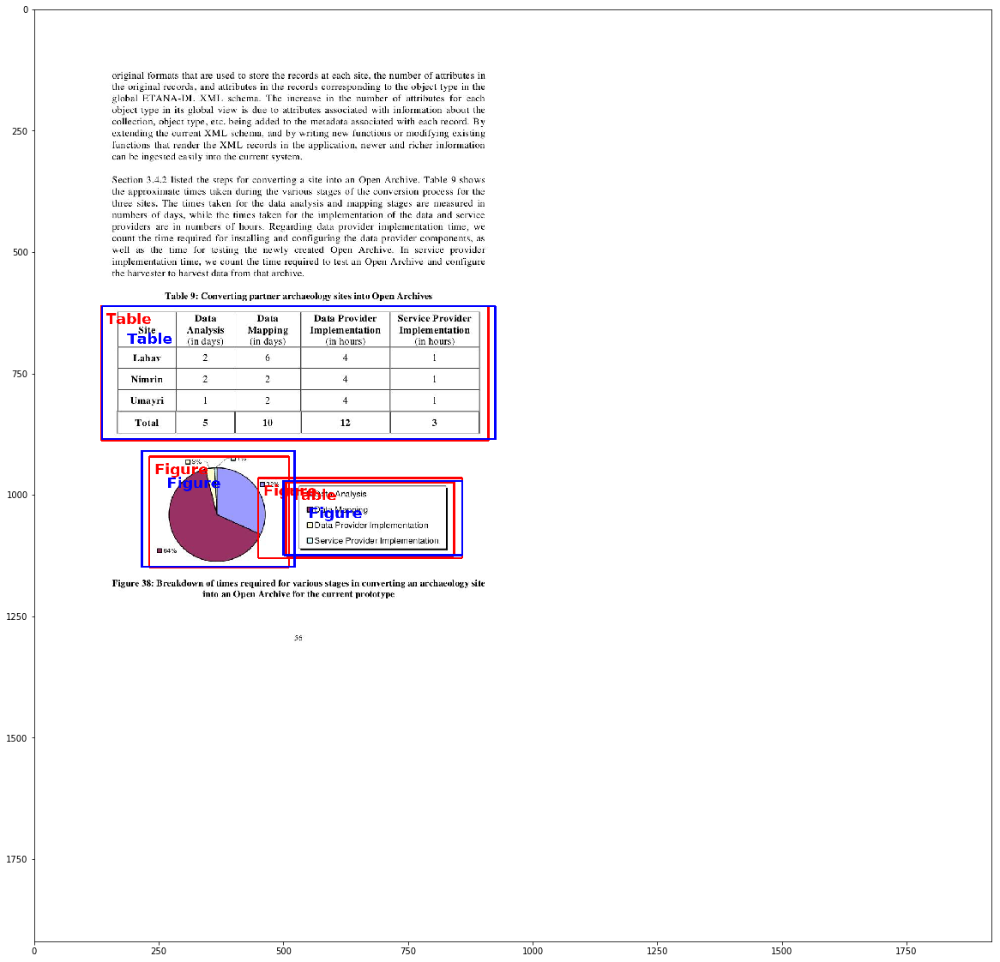

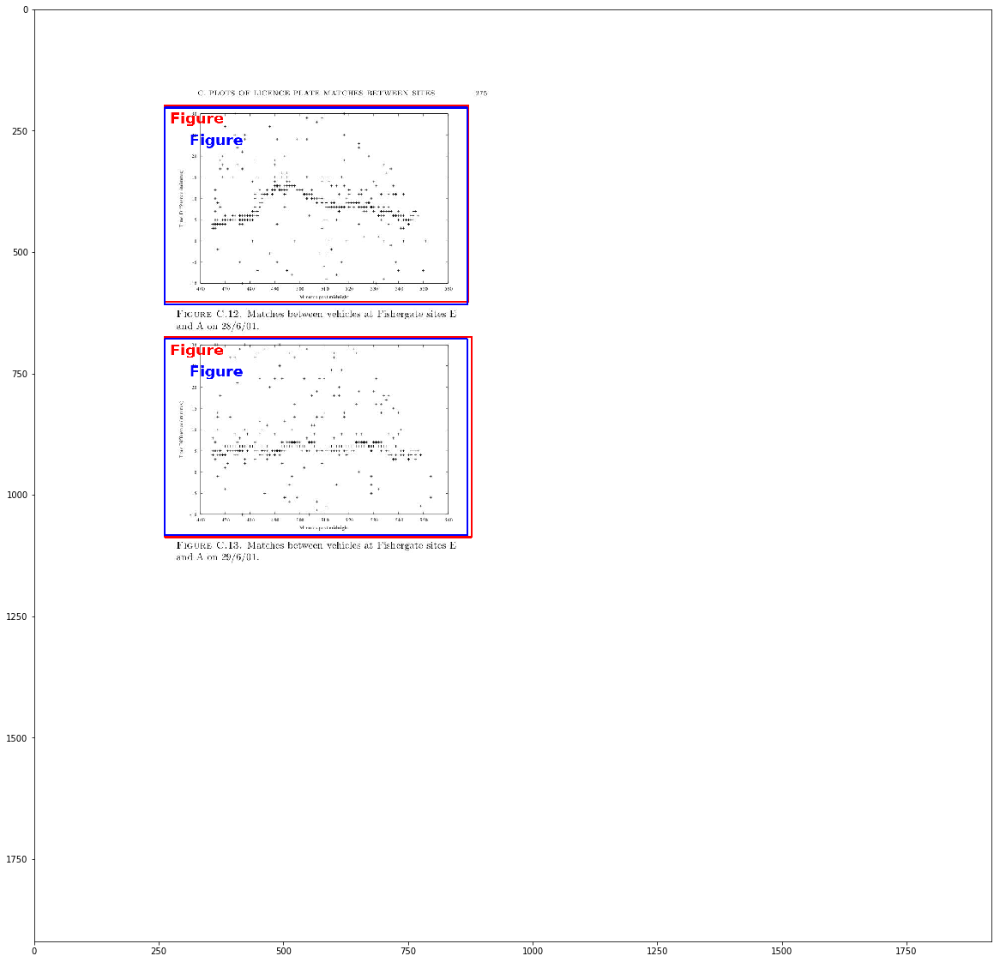

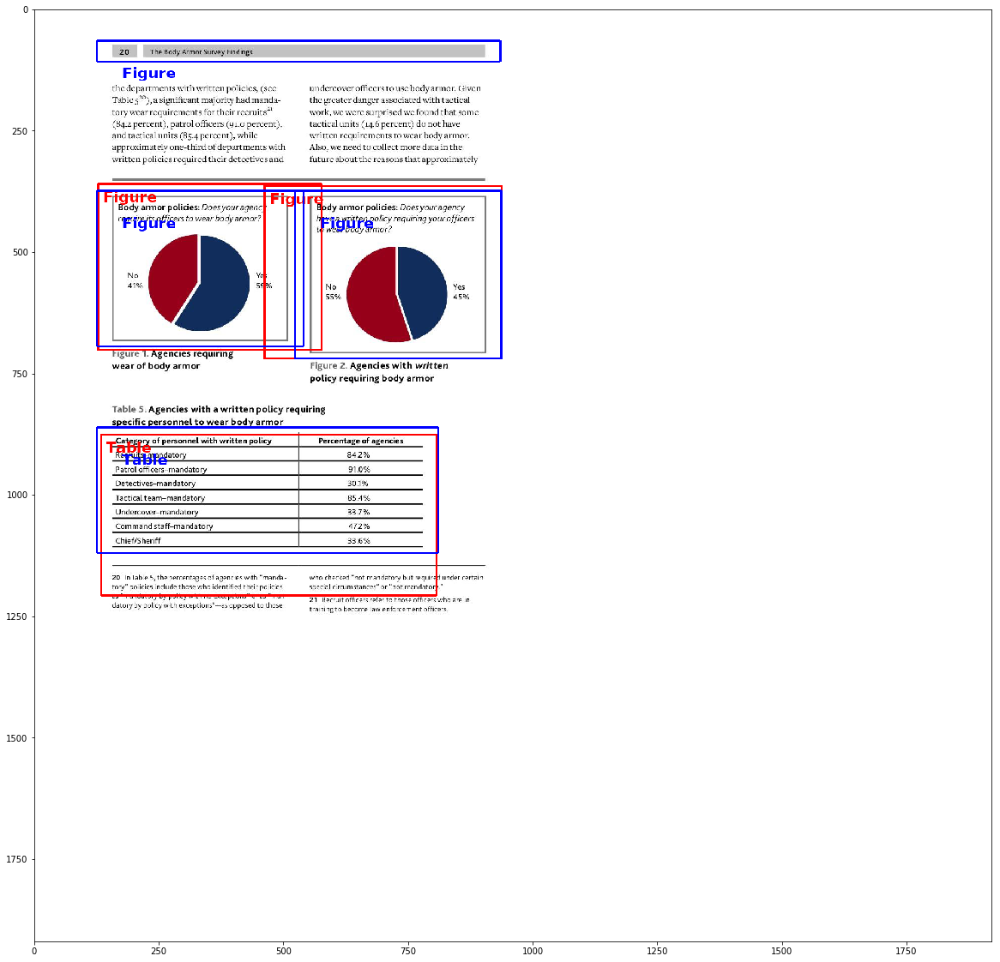

In [132]:
%matplotlib inline
for idx, image_id in enumerate(tqdm(image_ids1)):
        # Load image and ground truth data
        image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(data_test, inference_config,image_id, use_mini_mask=False)
        #print(image_meta)
        results = model.detect([image], verbose=0)
        r = results[0]
        #print(r)
        info = data_test.image_info[image_id]
        #print(gt_bbox)
        draw_image(info["str_id"], info["path"], r["rois"], gt_bbox, gt_class_id, r['class_ids'], r['scores'])